In [53]:
# -*- coding: utf-8 -*-
import os, sys
import glob
import json
sys.path.append("..")
sys.path.append("../..")
import dataset_utils.utils as utils
import dataset_utils.config as config
import pympi
import sklearn.metrics as metrics
from collections import defaultdict
import copy

In [54]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt

In [55]:
prediction_dir = os.path.join(config.DS_DIALOG, "detection_result")
label_dir = os.path.join(config.DS_DIALOG, "ant")
img_dir = os.path.join(config.DS_DIALOG, "image")
meta_dir = os.path.join(config.DS_DIALOG, "meta_info")
movie_files = ["01_01.MP4", "01_02.MP4", "02_01.MP4", "02_02.MP4", "03_01.MP4", "03_02.MP4"]
fig_dir = os.path.join(config.DS_DIALOG, "figure")
if not os.path.exists(fig_dir):
    os.mkdir(fig_dir)

## indexが合っているか注意が必要

In [ ]:
class DialogMovieData():
    # TODO
    pass

class PredictionResult():
    pass

In [77]:
def ms2frameid(ms):
    frame_ms = 50
    ms_rounded = ms - (ms % 50)
    return (ms_rounded / frame_ms)

def load_labels(movie_id, seat_id, ant_dir, frame_num):
    fname = "%s_%s.eaf" % (movie_id, seat_id)
    path = os.path.join(ant_dir, fname)
    eaf = pympi.Elan.Eaf(path)
    aid2tid = eaf.tiers["default"][0]
    tid2ms = eaf.timeslots
    slots = []
    for aid in sorted(aid2tid.keys(), key=lambda key: int(key[1:])):
        tid_start = aid2tid[aid][0]
        tid_end = aid2tid[aid][1]
        ms_start = tid2ms[tid_start]
        ms_end = tid2ms[tid_end]
        start = ms2frameid(ms_start)
        end = ms2frameid(ms_end)
        slots.append((start, end))
    labels = [0 for _ in range(frame_num)]
    for start, end in slots:
        try:
            for i in range(start, end):
                labels[i] = 1
        except Exception as e:
            print("error")
            print(start, end, frame_num)
            raise e
    return labels
    
    
def load_predictions(movie_id, seat_id, detection_result_dir, frame_num):
        fname = "%s_%s.json" % (movie_id, seat_id)
        path = os.path.join(detection_result_dir, fname)
        with open(path, "r") as fr:
            result = json.load(fr)
        predictions = [0 for _ in range(frame_num)]
        for fname, score in sorted(result.items()):
            fid = int(fname.split("_")[0])
            predictions[fid-1] = score[1]
        return predictions


# 結果の平滑化手法を複数試す
# 1. 周辺のフレームとの多数決
# 2. 前フレームとの多数決
# 3. 累積スコアでしきい値を用いて判定
def smooth_by_majority(predictions, window=5):
    def majority(li, left, right):
        left = 0 if left<0 else left
        right = len(li)-1 if right>=len(li) else right
        target = li[left:right+1]
        return 0 if sum(target) < (len(target)/2+1) else 1
        
    rpreds = [round(pred) for pred in predictions]
    wing = window/2
    for i in range(len(rpreds)):
        rpreds[i] = majority(rpreds, i-wing, i+wing)
    return rpreds

def smooth_predictions_by_average_score(predictions, window=5, threshold=0.5):
    def ave_score_over_threshold(li, left, right, threshold):
        left = 0 if left<0 else left
        right = len(li)-1 if right>=len(li) else right
        target = li[left:right+1]
        ave = float(sum(target)) / len(target)
        return 0 if ave < threshold else 1
    
    new_preds = [0 for _ in range(len(predictions))]
    wing = window/2
    for i in range(len(predictions)):
         new_preds[i] = ave_score_over_threshold(predictions, i-wing, i+wing, threshold)
    return new_preds

def average_predictions(predictions, window=5):
    def average(li, left, right):
        left = 0 if left<0 else left
        right = len(li)-1 if right>=len(li) else right
        target = li[left:right+1]
        ave = float(sum(target)) / len(target)
        return ave
    
    new_preds = [0 for _ in range(len(predictions))]
    wing = window/2
    for i in range(len(predictions)):
         new_preds[i] = average(predictions, i-wing, i+wing)
    return new_preds

def round_predictions(predictions, threshold=0.5):
    return [int(prediction>=threshold) for prediction in predictions]


def visualize(labels, predictions, frame_num, title, target=None, fig_path=None):
    x = [i for i in range(1, frame_num+1)]
    if target:
        x = x[target[0]:target[1]]
        labels = labels[target[0]:target[1]]
        predictions = predictions[target[0]:target[1]]
    fig, axes = plt.subplots(figsize=(40,5))
    fig.suptitle(title, fontsize=16)
    axes.plot(x, labels, linewidth=2, color="red")
    axes.plot(x, predictions, linewidth=0.3, color="#C3DEF1")
    plt.fill_between(x, predictions, 0, color="#C3DEF1")
    axes.set_ylim([0, 1.1])
    axes.set_ylabel("locked (1) or non-locked(0)")
    axes.set_xlabel("frame")
    if fig_path:
        plt.savefig(os.path.join(fig_path))
    
def calc_score(labels, predictions):
        fscore = metrics.f1_score(labels, predictions)
        recall = metrics.recall_score(labels, predictions)
        precision = metrics.precision_score(labels, predictions)
        return fscore, recall, precision

def visualize_raw(labels, predictions, frame_num, movie_id, seat_id, name, save_figure):
    predictions_rounded = round_predictions(predictions)
    fscore, recall, precision = calc_score(labels, predictions_rounded)
    title = "smooth:none, %s_%s, name: %s, (fscore, recall, precision):(%.3f, %.3f,%.3f)" % (movie_id, seat_id, name, fscore, recall, precision)
    if save_figure:
        fig_name = "%s_%s_%s_%s.png" % ("none", movie_id, seat_id, name)
        fig_path = os.path.join(fig_dir, fig_name)
    else:
        fig_path = None
    visualize(labels, predictions, frame_num, title, fig_path=fig_path)
   
    
def visualize_rounded(labels, predictions, frame_num, movie_id, seat_id, name, save_figure):
    predictions_rounded = round_predictions(predictions)
    fscore, recall, precision = calc_score(labels, predictions_rounded)
    title = "smooth:simple, %s_%s, name: %s, (fscore, recall, precision):(%.3f, %.3f,%.3f)" % (movie_id, seat_id, name, fscore, recall, precision)
    if save_figure:
        fig_name = "%s_%s_%s_%s.png" % ("none", movie_id, seat_id, name)
        fig_path = os.path.join(fig_dir, fig_name)
    else:
        fig_path = None
    visualize(labels, predictions_rounded, frame_num, title, fig_path=fig_path)

def visualize_majority(labels, predictions, frame_num, movie_id, seat_id, name, save_figure):
    for window in range(3, 11, 2):
        prediction_majority = smooth_by_majority(predictions, window)
        fscore, recall, precision = calc_score(labels, prediction_majority)
        title = "smooth: majority(window:%d), %s_%s, name: %s, (fscore, recall, precision):(%.3f, %.3f,%.3f)" % (window, movie_id, seat_id, name, fscore, recall, precision)
        if save_figure:
            fig_name = "%s_%s_%s_%s.png" % ("majority(window:%d)" % window, movie_id, seat_id, name)
            fig_path = os.path.join(fig_dir, fig_name)
        else:
            fig_path = None
        visualize(labels, prediction_majority, frame_num, title, fig_path=fig_path)


def visualize_average(labels, predictions, frame_num, movie_id, seat_id, name, save_figure):
    for window in range(3, 11, 2):
        prediction_average = ave_score(predictions, window)
        predictions_average_r = [round(score) for score in prediction_average]
        fscore, recall, precision = calc_score(labels, predictions_average_r)
        title = "smooth: average(window:%d), %s_%s, name: %s, (fscore, recall, precision):(%.3f, %.3f,%.3f)" % (window, movie_id, seat_id, name, fscore, recall, precision)
        if save_figure:
            fig_name = "%s_%s_%s_%s.png" % ("average(window:%d)" % window, movie_id, seat_id, name)
            fig_path = os.path.join(fig_dir, fig_name)
        else:
            fig_path = None
        visualize(labels, prediction_average, frame_num, title, fig_path=fig_path)

def visualize_average_smooth(labels, predictions, frame_num, movie_id, seat_id, name, save_figure):
    for window in range(3, 11, 2):
        for threshold_n in xrange(3, 8, 1):
            threshold = threshold_n / float(10)
            prediction_score = smooth_predictions_by_average_score(predictions, window, threshold)
            fscore, recall, precision = calc_score(labels, prediction_score)
            title = "smooth: score(window:%d, threshold:%.2f), %s_%s, name: %s, (fscore, recall, precision):(%.3f, %.3f,%.3f)" % (window, threshold, movie_id, seat_id, name, fscore, recall, precision)
            if save_figure:
                fig_name = "%s_%s_%s_%s.png" % ("score(window:%d,threshold:%.1f)" % (window, threshold), movie_id, seat_id, name)
                fig_path = os.path.join(fig_dir, fig_name)
            else:
                fig_path = None
            visualize(labels, prediction_score, frame_num, title, fig_path=fig_path)
        

def main(save_figure=False):
    for movie_file in movie_files:
        movie_id = movie_file.split(".")[0]
        for seat_id in ["A", "B", "C", "D"]:
            if not os.path.exists(os.path.join(label_dir, "%s_%s.eaf"% (movie_id, seat_id))):
                continue
            meta_path = os.path.join(meta_dir, "%s.json" % (movie_id.split("_")[0]))
            with open(meta_path, "r") as fr:
                info = json.load(fr)
            name = info[seat_id]["name"]
            frame_num = len(glob.glob(os.path.join(img_dir, movie_id, "*.png")))
            labels = load_labels(movie_id, seat_id, label_dir, frame_num)
            predictions = load_predictions(movie_id, seat_id, prediction_dir, frame_num)
            
            visualize_raw(labels, predictions, frame_num, movie_id, seat_id, name, save_figure)
            visualize_rounded(labels, predictions, frame_num, movie_id, seat_id, name, save_figure)
#             visualize_average(labels, predictions, frame_num, movie_id, seat_id, name, save_figure)
#             visualize_average_smooth(labels, predictions, frame_num, movie_id, seat_id, name, save_figure)

Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsin

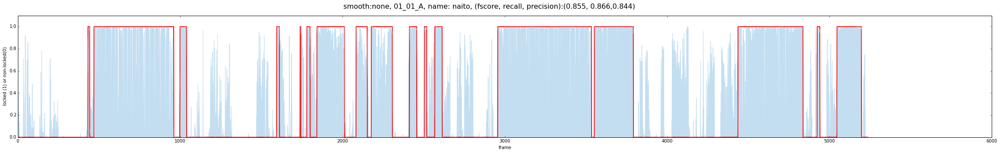

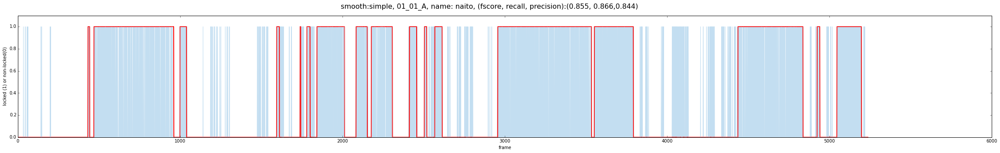

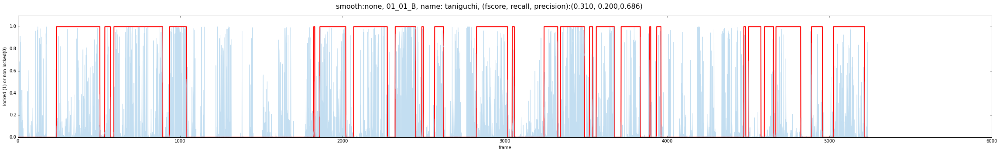

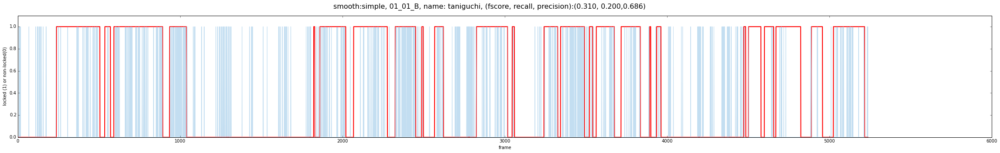

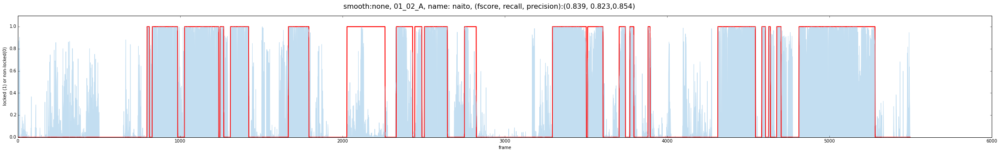

...

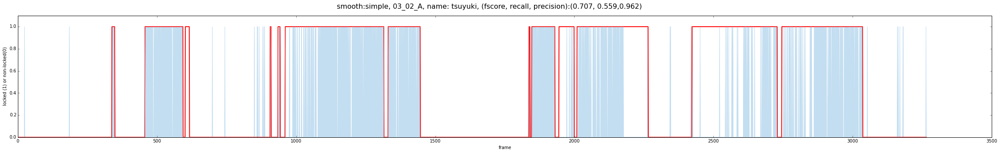

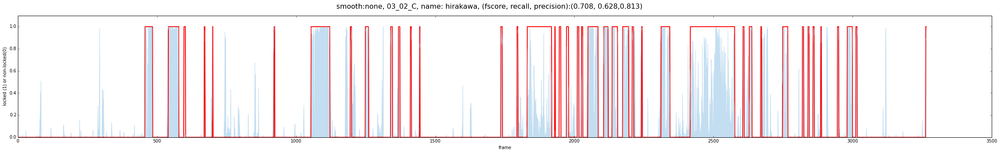

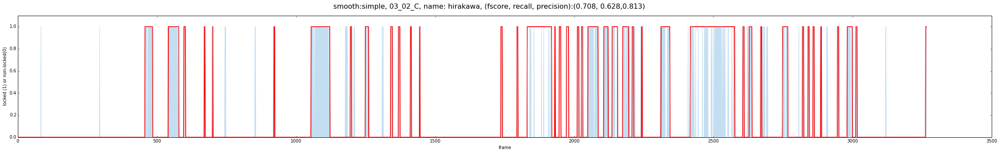

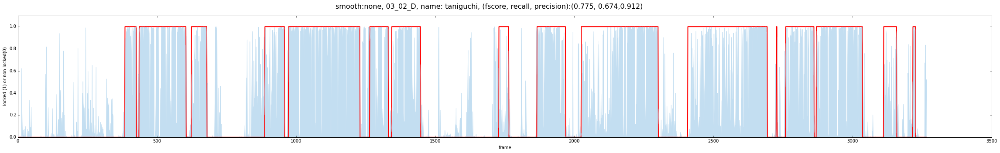

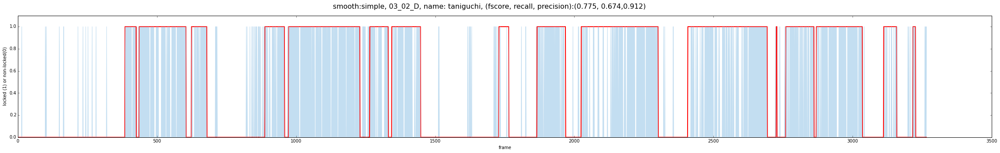

In [78]:
main(False)

# 各平滑化手法の比較
- 全セッションのfスコアの平均をスコアとして全ての平滑化手法を比較する

In [40]:
def compare_smoothing_methods():
    scores = defaultdict(list)
    for movie_file in movie_files:
            movie_id = movie_file.split(".")[0]
            for seat_id in ["A", "B", "C", "D"]:
                if movie_id == "01_01" and seat_id == "B":
                    continue
                if not os.path.exists(os.path.join(label_dir, "%s_%s.eaf"% (movie_id, seat_id))):
                    continue
                meta_path = os.path.join(meta_dir, "%s.json" % (movie_id.split("_")[0]))
                with open(meta_path, "r") as fr:
                    info = json.load(fr)
                name = info[seat_id]["name"]
                frame_num = len(glob.glob(os.path.join(img_dir, movie_id, "*.png")))
                labels = load_labels(movie_id, seat_id, label_dir, frame_num)
                predictions = load_predictions(movie_id, seat_id, prediction_dir, frame_num)
                predictions_rounded = [round(score) for score in predictions]
                fscore, recall, precision = calc_score(labels, predictions_rounded)
                scores["none"].append(fscore)
                for window in range(3, 11, 2):
                    prediction_majority = smooth_by_majority(predictions, window)
                    fscore, recall, precision = calc_score(labels, prediction_majority)
                    scores["majority_window%d" % window].append(fscore)
                    for threshold_n in xrange(2, 8, 1):
                        threshold = threshold_n / float(10)
                        prediction_score = smooth_by_score(predictions, window, threshold)
                        fscore, recall, precision = calc_score(labels, prediction_score)
                        scores["score_window%d_threshold%.1f" % (window, threshold)].append(fscore)
    return scores

In [41]:
scores =compare_smoothing_methods()
for method, scores in sorted(scores.items()):
    print("%s -> %.3f" % (method, sum(scores) / float(len(scores))))

Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsin

Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...


KeyboardInterrupt: 

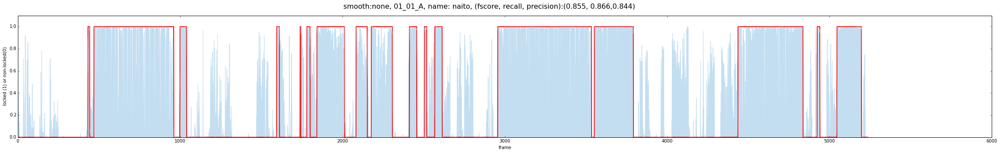

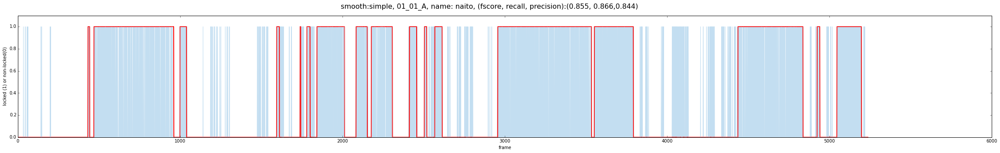

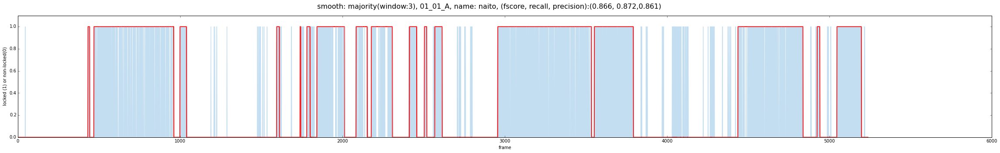

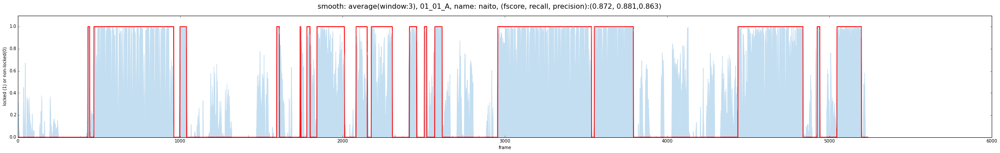

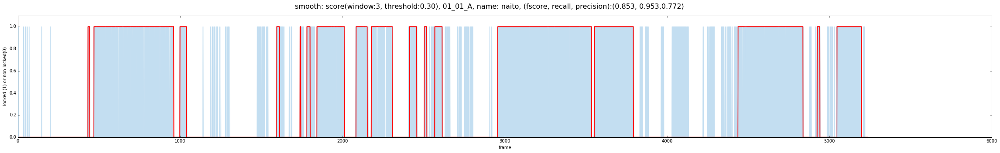

...

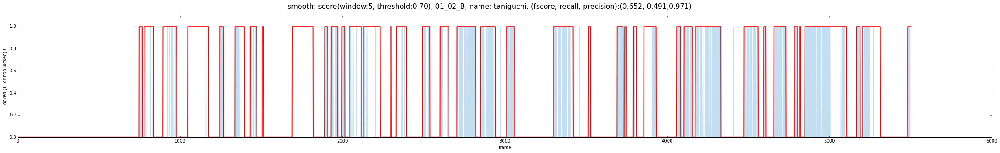

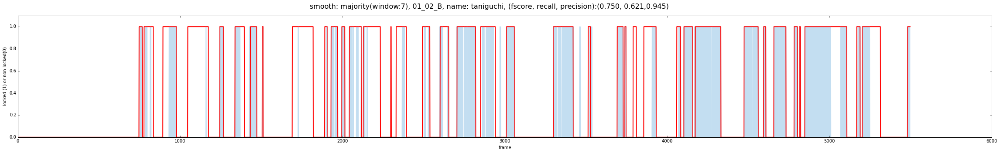

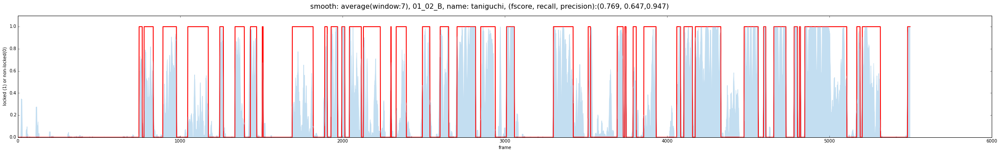

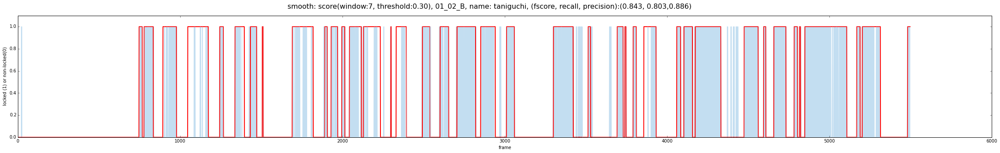

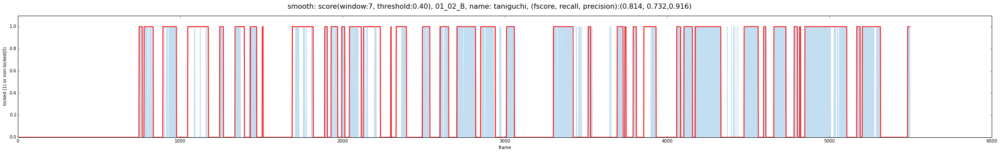

In [60]:
main()

In [64]:
movie_id = "02_01"
seat_id = "A"
frame_num = len(glob.glob(os.path.join(img_dir, movie_id, "*.png")))
labels = load_labels(movie_id, seat_id, label_dir, frame_num)
predictions = load_predictions(movie_id, seat_id, prediction_dir, frame_num)
title = "test"
# target=(2500, 3000)
# visualize(labels, predictions, frame_num, title, target)

smooth = smooth_by_score(predictions, window, threshold)
# visualize(labels, smooth, frame_num, title, target)


fscore = metrics.confusion_matrix(smooth, labels)
print(fscore)
print(metrics.accuracy_score(smooth, labels))

Parsing unknown version of ELAN spec... This could result in errors...
[[2489   68]
 [ 231 2289]]
0.9411069529249557
